In [2]:
import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
from torchvision.transforms import Resize, ToTensor, Normalize, Compose
from matplotlib import pyplot as plt

from torchvision.models import resnet50,ResNet50_Weights 

from io import open
import unicodedata
import re

In [3]:
if torch.cuda.is_available():
    device=torch.device(type='cuda', index=0)
else:
    device=torch.device(type='cpu', index=0)

print(f'Using device {device}')

Using device cuda:0


In [4]:
#unicode 2 ascii, remove non-letter characters, trim
def normalizeString(s): 
    sres=""
    for ch in unicodedata.normalize('NFD', s): 
        #Return the normal form form ('NFD') for the Unicode string s.
        if unicodedata.category(ch) != 'Mn':
            # The function in the first part returns the general 
            # category assigned to the character ch as string. 
            # "Mn' refers to Mark, Nonspacing
            sres+=ch
    #sres = re.sub(r"([.!?])", r" \1", sres) 
    # inserts a space before any occurrence of ".", "!", or "?" in the string sres. 
    sres = re.sub(r"[^a-zA-Z!?,]+", r" ", sres) 
    # this line of code replaces any sequence of characters in sres 
    # that are not letters (a-z or A-Z) or the punctuation marks 
    # "!", "," or "?" with a single space character.
    return sres.strip()

In [5]:
#driver code part 1

capt_file_path="/kaggle/input/flickr8k/captions.txt"
images_dir_path="/kaggle/input/flickr8k/Images/"

#read data
data=open(capt_file_path).read().strip().split('\n')
data=data[1:]

img_filenames_list=[]
captions_list=[]

for s in data:
    templist=s.lower().split(",")
    img_path=templist[0]
    caption=",".join(s for s in templist[1:])
    caption=normalizeString(caption)
    img_filenames_list.append(img_path)
    captions_list.append(caption)

In [6]:
max_cap_length = 73

In [7]:
class Vocab:
    def __init__(self):
        self.word2index={'SOS':0, 'EOS':1}
        self.index2word={0:'SOS', 1:'EOS'}
        self.word2count={}
        self.nwords=2
    
    def buildVocab(self,s):
        for word in s.split(" "):
            if word not in self.word2index:
                self.word2index[word]=self.nwords
                self.index2word[self.nwords]=word
                self.word2count[word]=1
                self.nwords+=1
            else:
                self.word2count[word]+=1

In [8]:
#driver code part 2

#create Vocab objects for each language
vocab=Vocab()

#build the vocab
for caption in captions_list:
    vocab.buildVocab(caption)

#print vocab size
print("Vocab Length:",vocab.nwords)

Vocab Length: 8446


In [9]:
class CustomDataset(Dataset):
    def __init__(self,images_dir_path, img_filenames_list, captions_list, vocab, max_cap_length):
        super().__init__()
        self.images_dir_path=images_dir_path
        self.img_filenames_list=img_filenames_list
        self.captions_list=captions_list
        self.length=len(self.captions_list)
        self.transform=Compose([Resize((224,224), antialias=True), ToTensor(), Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])
        self.vocab=vocab
        self.max_cap_length=max_cap_length
    
    def __len__(self):
        return self.length
    
    def get_input_ids(self, sentence,vocab):
        input_ids=[0]*(self.max_cap_length+1)
        i=0
        for word in sentence.split(" "):
            input_ids[i]=vocab.word2index[word]
            i=i+1

        input_ids.insert(0,vocab.word2index['SOS'])
        i=i+1
        input_ids[i]=vocab.word2index['EOS']
    
        return torch.tensor(input_ids)
    
    def __getitem__(self,idx):
        imgfname,caption=self.img_filenames_list[idx],self.captions_list[idx]
        
        imgfname=self.images_dir_path+imgfname
        img=Image.open(imgfname)
        img=self.transform(img)
        
        caption=self.get_input_ids(caption,self.vocab)       
        
        return img,caption

In [10]:
#driver code part 3
dataset=CustomDataset(images_dir_path, img_filenames_list, captions_list, vocab, max_cap_length)
train_dataset,test_dataset=random_split(dataset,[0.999,0.001])

batch_size=64
train_dataloader=DataLoader(dataset=train_dataset,batch_size=batch_size, shuffle=True)
test_dataloader=DataLoader(dataset=test_dataset,batch_size=1, shuffle=False)

In [11]:
class Encoder(nn.Module):
    def __init__(self, pretrained_feature_extractor):
        super().__init__()
        self.pretrained_feature_extractor=pretrained_feature_extractor
        
    def forward(self,x):
        features=self.pretrained_feature_extractor(x)
        return features

In [12]:
#driver code part 4
pretrained_feature_extractor=resnet50(weights=ResNet50_Weights.DEFAULT)
pretrained_feature_extractor.fc=nn.Linear(2048,1024)

encoder=Encoder(pretrained_feature_extractor).to(device)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 139MB/s] 


In [13]:
class Decoder(nn.Module):
    def __init__(self,output_size,embed_size,hidden_size):
        super().__init__()
        self.e=nn.Embedding(output_size,embed_size)
        self.relu=nn.ReLU()
        self.gru=nn.GRU(embed_size, hidden_size, batch_first=True)
        self.lin=nn.Linear(hidden_size,output_size)
        self.lsoftmax=nn.LogSoftmax(dim=-1)
    
    def forward(self,x,prev_hidden):
        x=self.e(x)
        x=self.relu(x)
        output,hidden=self.gru(x,prev_hidden)
        y=self.lin(output)
        y=self.lsoftmax(y)
        return y, hidden

In [14]:
#driver code part 5
embed_size=300
hidden_size=1024

decoder=Decoder(vocab.nwords,embed_size,hidden_size).to(device)

In [15]:
def train_one_epoch():
    encoder.train()
    decoder.train()
    track_loss=0
    
    for i, (imgs,t_ids) in enumerate(train_dataloader):
        imgs=imgs.to(device)
        t_ids=t_ids.to(device)
        extracted_features=encoder(imgs)
        #extracted_features=extracted_features.detach()
        decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1))
        yhats, decoder_hidden = decoder(t_ids[:,0:-1],decoder_hidden)
                    
        gt=t_ids[:,1:]
        
        yhats_reshaped=yhats.view(-1,yhats.shape[-1])
        
        gt=gt.reshape(-1)
        
        
        loss=loss_fn(yhats_reshaped,gt)
        track_loss+=loss.item()
        
        opte.zero_grad()
        optd.zero_grad()
        
        loss.backward()
        
        opte.step()
        optd.step()
        
        if i%50==0:
            print("Mini Batch=", i+1," Running Loss=",track_loss/(i+1), sep="")
        
    return track_loss/len(train_dataloader)

In [16]:
def ids2Sentence(ids,vocab):
    sentence=""
    for id in ids.squeeze():
        if id==0:
            continue
        word=vocab.index2word[id.item()]
        sentence+=word + " "
        if id==1:
            break
    return sentence

In [17]:
#eval loop (written assuming batch_size=1)
def eval_one_epoch():
    encoder.eval()
    decoder.eval()
    track_loss=0
    
    with torch.no_grad():
        
        for i, (imgs,t_ids) in enumerate(test_dataloader):
            
            imgs=imgs.to(device)
            t_ids=t_ids.to(device)
            
            extracted_features=encoder(imgs)
            
            decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1)) #n_dim=3
            
            input_ids=t_ids[:,0]
            yhats=[]
            pred_sentence=""
            
            for j in range(1,max_cap_length+2): #j starts from 1
                probs, decoder_hidden = decoder(input_ids.unsqueeze(1),decoder_hidden)
                yhats.append(probs)
                _,input_ids=torch.topk(probs,1,dim=-1)
                input_ids=input_ids.squeeze(1,2) #still a tensor
                word=vocab.index2word[input_ids.item()] #batch_size=1
                pred_sentence+=word + " "
                if input_ids.item() == 1: #batch_size=1
                    break
                                
            
            gt_sentence=ids2Sentence(t_ids,vocab)
            
            print("Input Image:")
            img=imgs[0]
            img[0]=(img[0]*0.229)+0.485
            img[1]=(img[1]*0.224)+0.456
            img[2]=(img[2]*0.225)+0.406
            plt.imshow(torch.permute(imgs[0],(1,2,0)).detach().cpu())
            plt.show()
            
            print("GT Sentence:",gt_sentence)
            
            print("Predicted Sentence:",pred_sentence)
            
            yhats_cat=torch.cat(yhats,dim=1)
            yhats_reshaped=yhats_cat.view(-1,yhats_cat.shape[-1])
            gt=t_ids[:,1:j+1]
            gt=gt.view(-1)
            

            loss=loss_fn(yhats_reshaped,gt)
            track_loss+=loss.item()
            
            
        print("-----------------------------------")
        return track_loss/len(test_dataloader)

Mini Batch=1 Running Loss=9.061957359313965
Mini Batch=51 Running Loss=5.2373098392112585
Mini Batch=101 Running Loss=4.724041145626861
Mini Batch=151 Running Loss=4.446571332729415
Mini Batch=201 Running Loss=4.244450800454438
Mini Batch=251 Running Loss=4.089496536558843
Mini Batch=301 Running Loss=3.9705372910166896
Mini Batch=351 Running Loss=3.875201406641903
Mini Batch=401 Running Loss=3.7945709710109266
Mini Batch=451 Running Loss=3.724254987720904
Mini Batch=501 Running Loss=3.6606924200724222
Mini Batch=551 Running Loss=3.607304370987437
Mini Batch=601 Running Loss=3.5563662544066417
Epoch=1 Loss=3.5272
Mini Batch=1 Running Loss=2.6534907817840576
Mini Batch=51 Running Loss=2.67239740783093
Mini Batch=101 Running Loss=2.6825557486845715
Mini Batch=151 Running Loss=2.6764551630083298
Mini Batch=201 Running Loss=2.6732132173889314
Mini Batch=251 Running Loss=2.6676312157832296
Mini Batch=301 Running Loss=2.665614303956396
Mini Batch=351 Running Loss=2.6617985743063466
Mini Batch

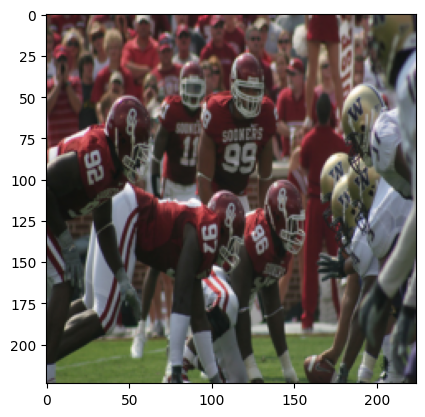

GT Sentence: a large group of football players about to start a game with a large group watching EOS 
Predicted Sentence: a bunch of football players and a crowd EOS 
Input Image:


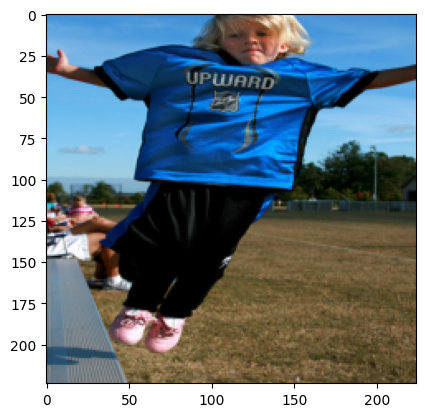

GT Sentence: a child jumping off bleachers with a blue shirt EOS 
Predicted Sentence: a young boy wearing a blue shirt is jumping in the air EOS 
Input Image:


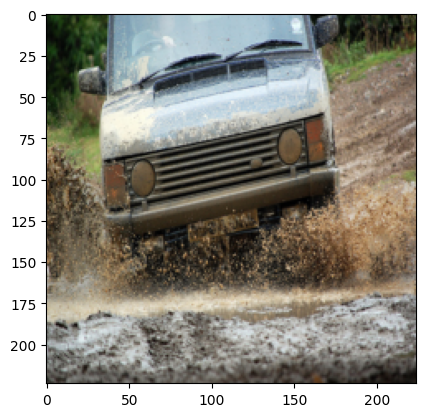

GT Sentence: an off road vehicle driving through a mud puddle EOS 
Predicted Sentence: a man driving through a large puddle EOS 
Input Image:


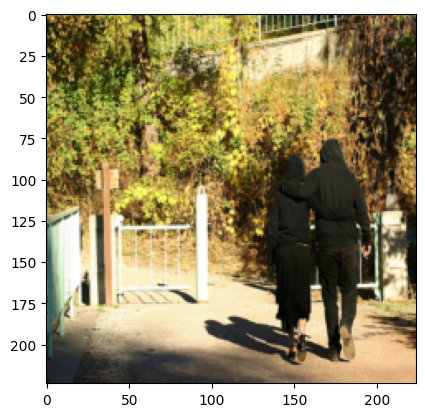

GT Sentence: a couple in black clothes are walking towards a white gate EOS 
Predicted Sentence: a couple hurrying together in a park EOS 
Input Image:


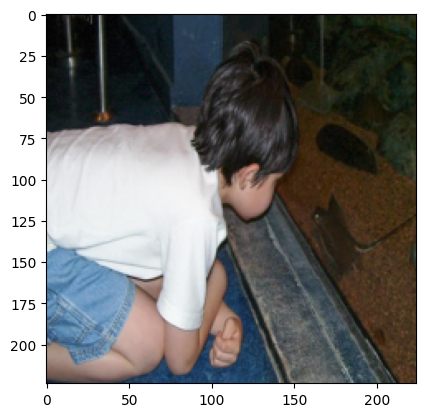

GT Sentence: a child looks at rodents in a glass display EOS 
Predicted Sentence: a boy is looking through a large hole EOS 
Input Image:


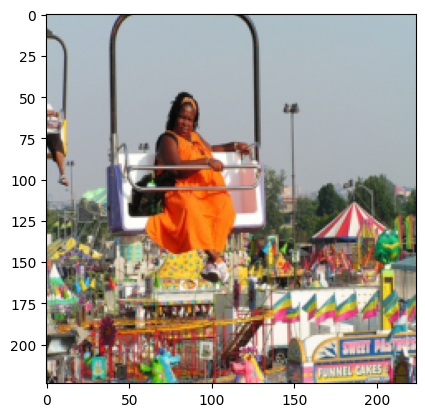

GT Sentence: a lady in an orange dress rides a ride at the fair EOS 
Predicted Sentence: a woman is sitting on a stool in a colorful fair EOS 
Input Image:


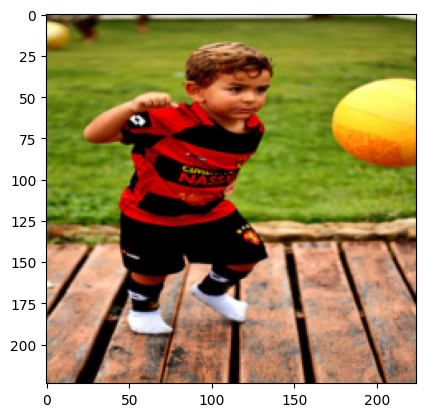

GT Sentence: a boy chasing a yellow ball EOS 
Predicted Sentence: a small boy is playing with a red ball EOS 
Input Image:


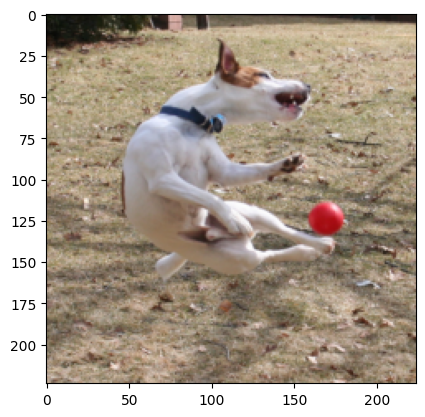

GT Sentence: a dog jumps for a red ball on the grass EOS 
Predicted Sentence: a white dog with a red bandanna is playing with a red ball EOS 
Input Image:


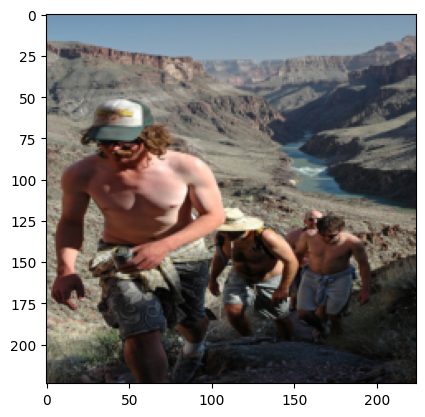

GT Sentence: four shirtless men are hiking up a canyon EOS 
Predicted Sentence: shirtless men hike up a canyon EOS 
Input Image:


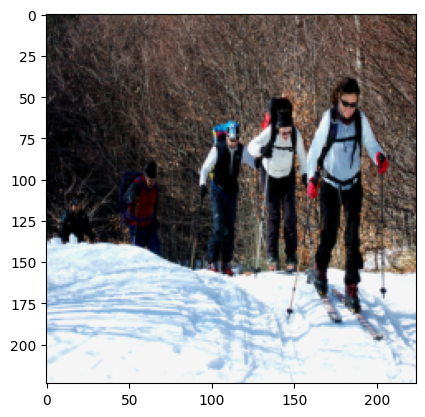

GT Sentence: a group of people hike in skis EOS 
Predicted Sentence: a group of people are sledding and a man in a blue jacket and red hat is in the snow EOS 
Input Image:


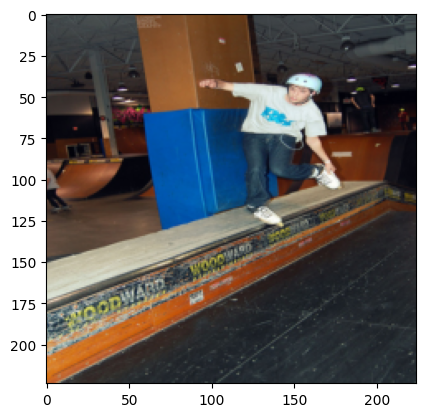

GT Sentence: a roller blader grinds a rail at an indoor skate park EOS 
Predicted Sentence: a man is skateboarding on a ramp EOS 
Input Image:


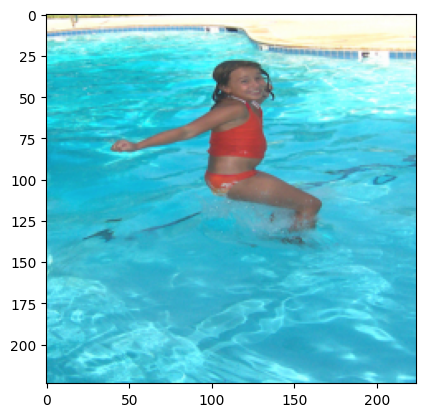

GT Sentence: a girl enjoys the swimming pool EOS 
Predicted Sentence: a girl in a red bathing suit is in the swimming pool EOS 
Input Image:


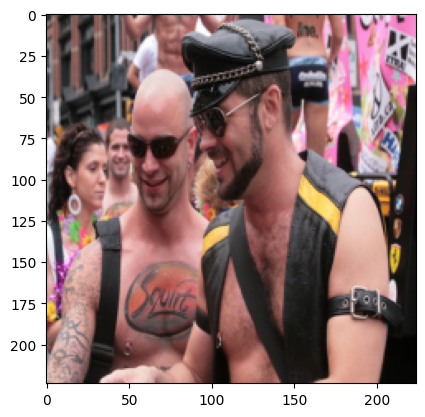

GT Sentence: shirtless men with leather vests are smiling EOS 
Predicted Sentence: a man and a woman with feathers and masks EOS 
Input Image:


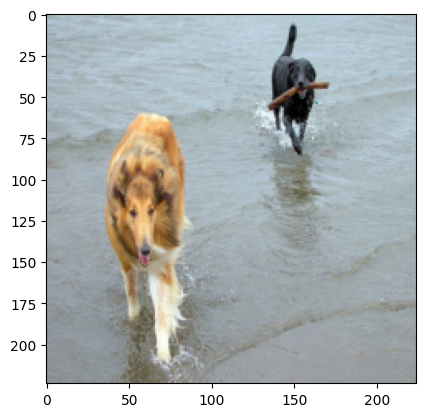

GT Sentence: two dogs in water with one retrieving a stick EOS 
Predicted Sentence: a dog with a stick in its mouth runs out of the water EOS 
Input Image:


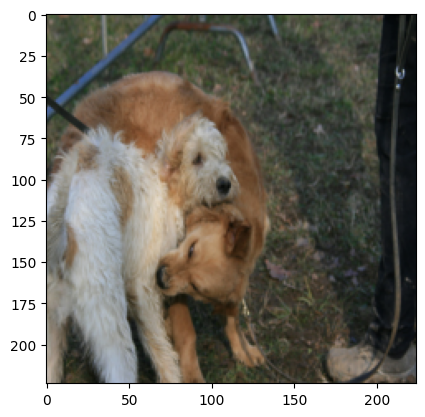

GT Sentence: the brown dog is on a leash and appears to be playing with the white and brown colored dog EOS 
Predicted Sentence: two dogs are fighting over a piece of wood EOS 
Input Image:


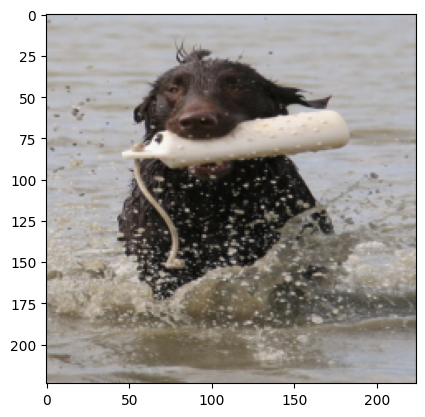

GT Sentence: a dog running through water with a white toy in its mouth EOS 
Predicted Sentence: a black dog is splashing through the water EOS 
Input Image:


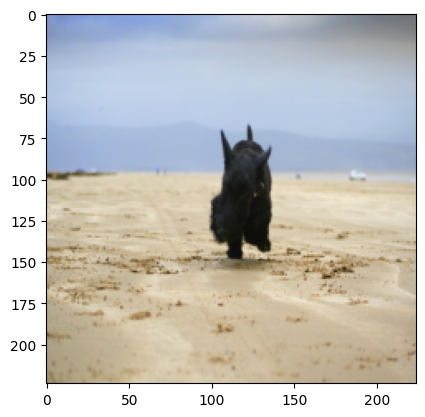

GT Sentence: a short black dog is walking over a barren landscape EOS 
Predicted Sentence: a black dog runs through the sand EOS 
Input Image:


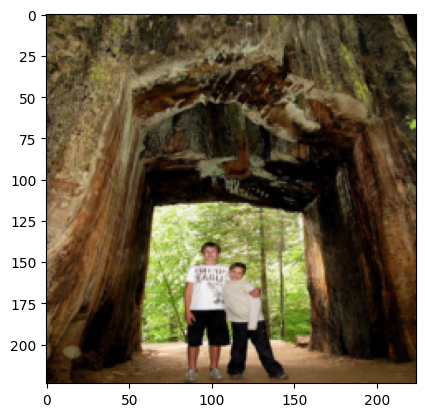

GT Sentence: two kids stand under an area carved in a large tree EOS 
Predicted Sentence: a man and a woman in a white shirt and a man in a white shirt and a woman in a white shirt and a black shirt is walking past a tree trunk EOS 
Input Image:


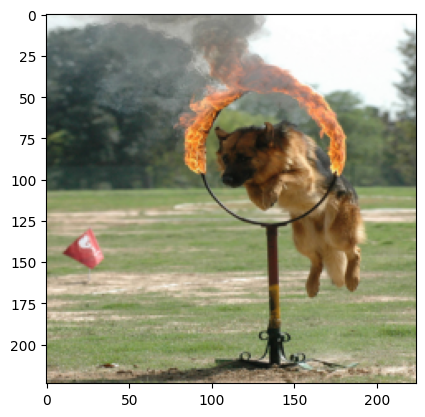

GT Sentence: a german shepherd is jumping through a ring on fire EOS 
Predicted Sentence: a dog is jumping over a flaming and a fire EOS 
Input Image:


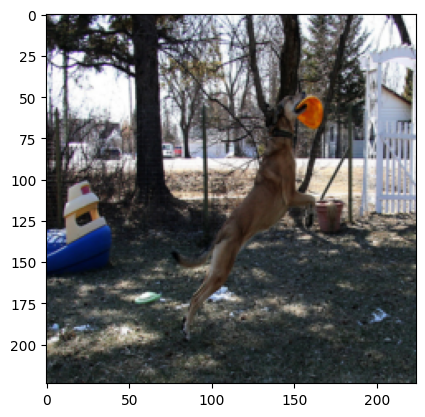

GT Sentence: a brown dog leaps up to catch an orange toy EOS 
Predicted Sentence: a dog jumps in the air to catch a toy EOS 
Input Image:


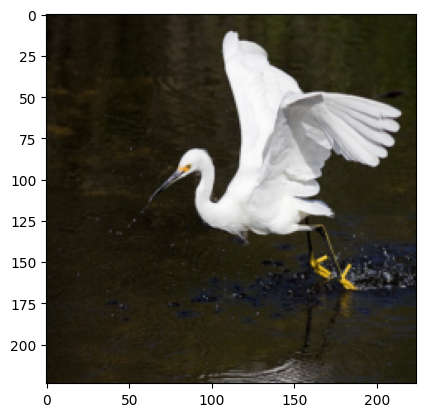

GT Sentence: a white crane is flying above some water EOS 
Predicted Sentence: a large bird flies out of the water EOS 
Input Image:


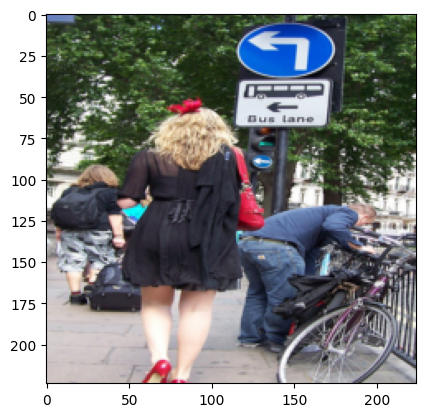

GT Sentence: the woman wearing a red bow walks past a bicycle EOS 
Predicted Sentence: a woman in a red sequined costume is taking a picture of a man in a red bandanna EOS 
Input Image:


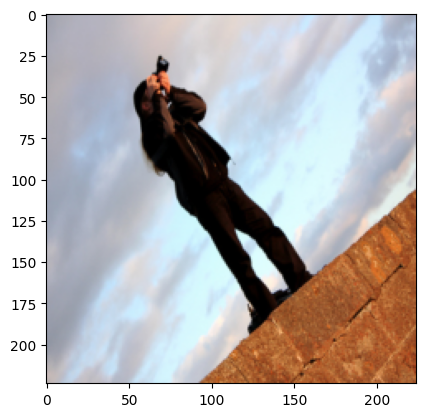

GT Sentence: the woman is holding a camera and standing on a brick wall EOS 
Predicted Sentence: a woman is looking up and down a steep path EOS 
Input Image:


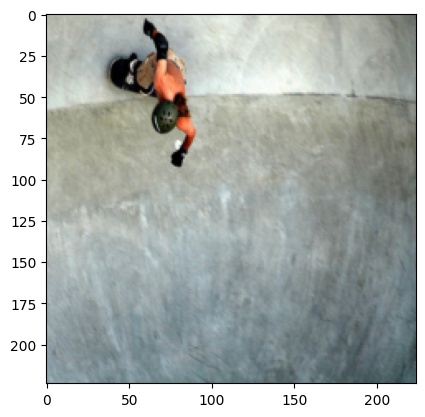

GT Sentence: a girl performs skateboarding tricks in an arena for skateboarders , while wearing a helmet EOS 
Predicted Sentence: a man in a wetsuit is surfing a wave EOS 
Input Image:


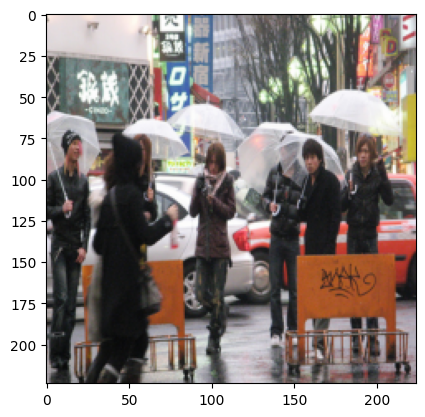

GT Sentence: a group of people with clear umbrellas standing on the street EOS 
Predicted Sentence: a group of foreign people are walking through a busy street EOS 
Input Image:


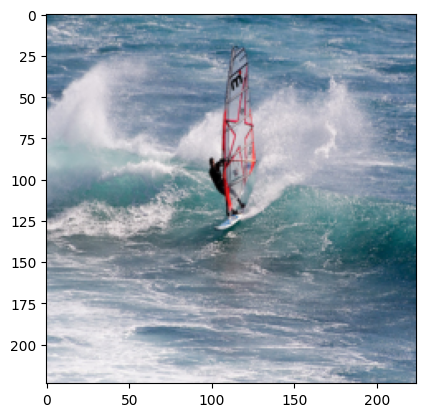

GT Sentence: a windsurfer in the waves of the ocean EOS 
Predicted Sentence: a man is skiing down a large wave EOS 
Input Image:


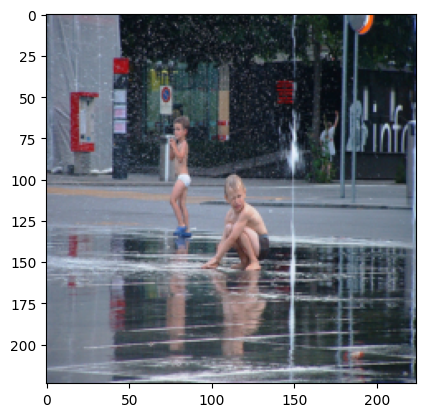

GT Sentence: two boys in underwear play in the water in the city street EOS 
Predicted Sentence: two girls in swimsuits are hugging each other in a city EOS 
Input Image:


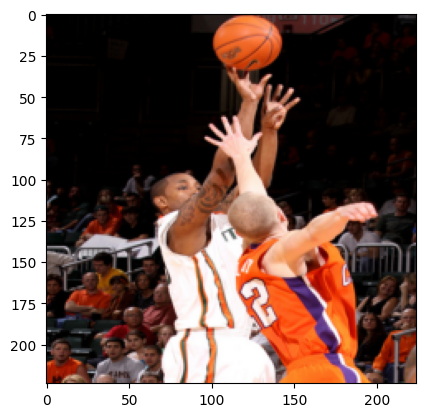

GT Sentence: two men jump for the basketball EOS 
Predicted Sentence: two basketball players fighting for the ball EOS 
Input Image:


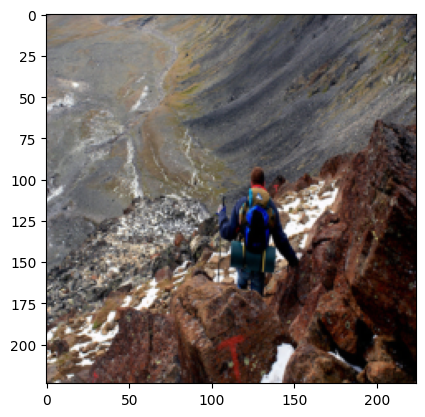

GT Sentence: hiker climbing down a snow and rock covered mountain EOS 
Predicted Sentence: a hiker walks along a rocky terrain EOS 
Input Image:


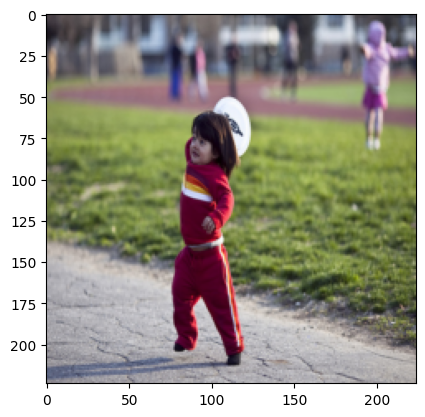

GT Sentence: a little girl tries to throw a frisbee EOS 
Predicted Sentence: a little girl is running through a grassy area EOS 
Input Image:


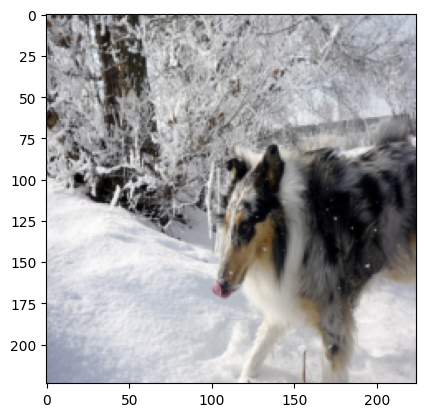

GT Sentence: a black , white and brown dog waking in the snow with a red toy in its mouth near an icey tree EOS 
Predicted Sentence: a black and white dog is running through the snow EOS 
Input Image:


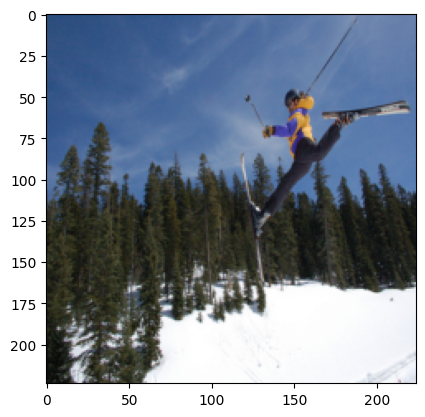

GT Sentence: a man in a blue an yellow coat ski jumps EOS 
Predicted Sentence: a person is jumping a high high in the air over a snowfield EOS 
Input Image:


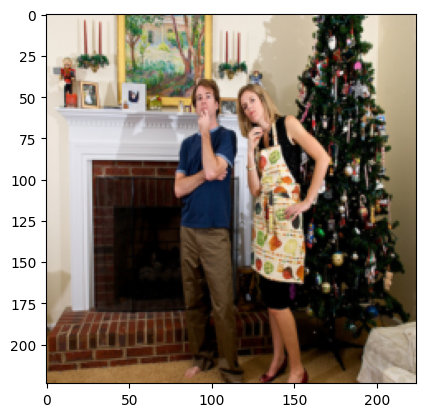

GT Sentence: a man and a woman in a apron stand near a fireplace and christmas tree EOS 
Predicted Sentence: a man and a woman are posing for a picture with a christmas tree EOS 
Input Image:


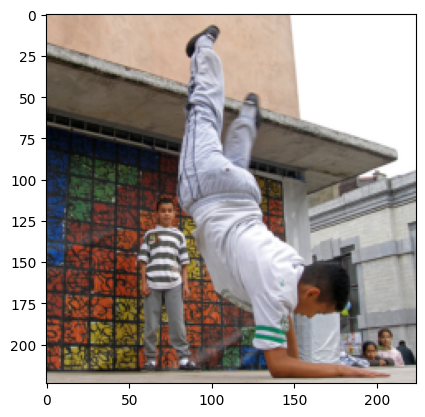

GT Sentence: a man balances on his forearms while a child watches in front of a colorful background EOS 
Predicted Sentence: a man is standing on the sidewalk with his foot pointed out EOS 
Input Image:


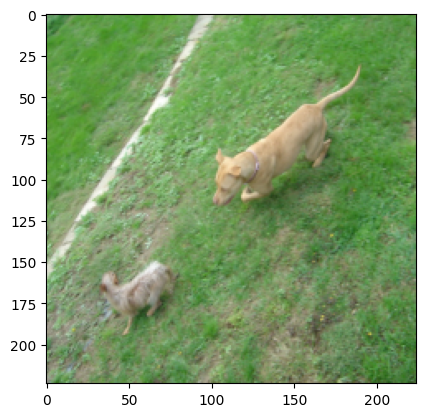

GT Sentence: a small dog stops in its tracks to look at the big dog chasing it EOS 
Predicted Sentence: a dog is lying on the grass EOS 
Input Image:


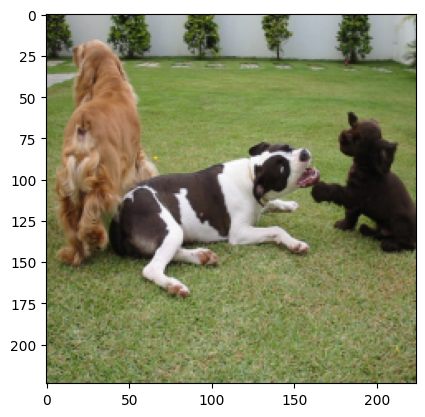

GT Sentence: three dogs playing and laying on the grass EOS 
Predicted Sentence: three dogs play with each other in the grass EOS 
Input Image:


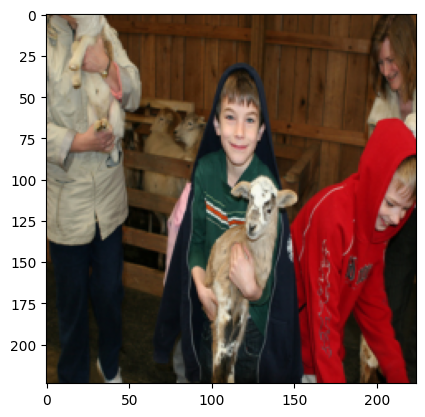

GT Sentence: a boy wearing a blue hood holds a baby animal and smiles EOS 
Predicted Sentence: a boy holds a goat EOS 
Input Image:


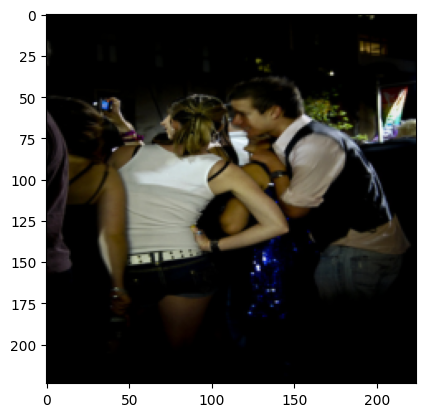

GT Sentence: a man flirts with a woman in a white tank top EOS 
Predicted Sentence: a group of people sitting together outside EOS 
Input Image:


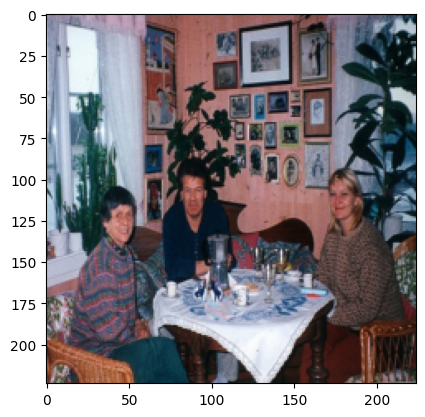

GT Sentence: three individuals sit at a table , smiling EOS 
Predicted Sentence: three people sit and talk at a table EOS 
Input Image:


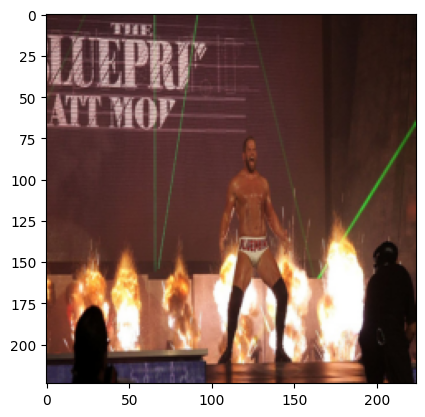

GT Sentence: an almost naked man on a stage with fire EOS 
Predicted Sentence: a man in a darkened suit walks on fire EOS 
-----------------------------------
Epoch=1 Loss=7.3814


In [18]:
#driver code part 5

loss_fn=nn.NLLLoss(ignore_index=0).to(device)
lr=0.001

optd=optim.Adam(params=decoder.parameters(), lr=lr)
opte=optim.Adam(params=encoder.parameters(), lr=lr)

n_epochs=5

for e in range(n_epochs):
    print("Epoch=",e+1, " Loss=", round(train_one_epoch(),4), sep="")

for e in range(1):
    print("Epoch=",e+1, " Loss=", round(eval_one_epoch(),4), sep="")